#**ISA 444: Final Project**
**Option 1: Hotel Forecasting**

By Nate Adkins

In [1]:
#%pip install utilsforecast
#%pip install statsforecast
#%pip install mlforecast
#%pip install neuralforecast
import pandas as pd
from utilsforecast.plotting import plot_series
from utilsforecast.losses import rmse, mae, mape
from utilsforecast.evaluation import evaluate
from statsforecast import StatsForecast
from statsforecast.models import (Naive, SeasonalNaive, AutoARIMA, AutoETS)
from mlforecast import MLForecast
from mlforecast.lag_transforms import RollingMean
from lightgbm import LGBMRegressor
from neuralforecast import NeuralForecast

from neuralforecast.auto import AutoNHITS, AutoNBEATS



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.6/354.6 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.4/287.4 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.7/280.7 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 4.6 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.3
    Uninstalling scipy-1.16.3:
      Successfully uninstalled scipy-1.16.3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.4/72.4 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.2/263.2 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.5/84

**Importing the Data File**

In [2]:
data = "/content/drive/MyDrive/ISA444/sample_hotels.parquet"
hotel_data = pd.read_parquet(data)

hotel_data

,unique_id,ds,holiday_flag,target_day,target_month,target_year,location_type,hotel_type,y,otb_1,...,otb_51,otb_52,otb_53,otb_54,otb_55,otb_56,otb_57,otb_58,otb_59,otb_60
1430,hotel_0,2022-01-01,no,Sat,Jan,2022,NonSuburban,Resorts & Destinations,0.975309,0.679012,...,0.197531,0.197531,0.197531,0.185185,0.160494,0.160494,0.160494,0.160494,0.160494,0.160494
1431,hotel_0,2022-01-02,no,Sun,Jan,2022,NonSuburban,Resorts & Destinations,0.493827,0.308642,...,0.074074,0.074074,0.074074,0.074074,0.074074,0.061728,0.061728,0.061728,0.061728,0.049383
1432,hotel_0,2022-01-03,no,Mon,Jan,2022,NonSuburban,Resorts & Destinations,0.456790,0.358025,...,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691
1433,hotel_0,2022-01-04,no,Tue,Jan,2022,NonSuburban,Resorts & Destinations,0.592593,0.419753,...,0.074074,0.074074,0.074074,0.074074,0.061728,0.061728,0.037037,0.037037,0.024691,0.024691
1434,hotel_0,2022-01-05,no,Wed,Jan,2022,NonSuburban,Resorts & Destinations,0.530864,0.407407,...,0.074074,0.074074,0.074074,0.074074,0.074074,0.049383,0.049383,0.024691,0.024691,0.012346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298037,hotel_133,2023-06-26,no,Mon,Jun,2023,NonSuburban,Resorts & Destinations,0.983607,0.918033,...,0.540984,0.524590,0.524590,0.524590,0.508197,0.508197,0.508197,0.491803,0.475410,0.491803
298038,hotel_133,2023-06-27,no,Tue,Jun,2023,NonSuburban,Resorts & Destinations,0.983607,0.934426,...,0.557377,0.573770,0.557377,0.557377,0.557377,0.540984,0.540984,0.540984,0.540984,0.524590
298039,hotel_133,2023-06-28,no,Wed,Jun,2023,NonSuburban,Resorts & Destinations,0.950820,0.868852,...,0.491803,0.491803,0.508197,0.491803,0.491803,0.491803,0.475410,0.459016,0.459016,0.459016
298040,hotel_133,2023-06-29,no,Thu,Jun,2023,NonSuburban,Resorts & Destinations,0.918033,0.852459,...,0.508197,0.475410,0.475410,0.491803,0.475410,0.475410,0.475410,0.459016,0.426230,0.426230


**Cleaning the Data**

In [14]:
tidy_df = hotel_data.rename(columns={
    'Property': 'unique_id',
    'Date': 'ds',
    'Demand': 'y'
})

# ensuring the correct data types
tidy_df['ds'] = pd.to_datetime(tidy_df['ds'])
tidy_df['unique_id'] = tidy_df['unique_id'].astype(str)
tidy_df['y'] = tidy_df['y'].astype(float)

# sorting the data
tidy_df = tidy_df.sort_values(['unique_id', 'ds']).reset_index(drop=True)

print(f"Number of unique properties: {tidy_df['unique_id'].nunique()}")
print("The unique hotel ids:", tidy_df['unique_id'].unique() )
print(f"Data start date: {tidy_df['ds'].min()}")
print(f"Data end date: {tidy_df['ds'].max()}")


tidy_df=tidy_df.query('unique_id != "hotel_77"')
tidy_df

Number of unique properties: 19
The unique hotel ids: ['hotel_0' 'hotel_105' 'hotel_112' 'hotel_126' 'hotel_133' 'hotel_14'
 'hotel_21' 'hotel_28' 'hotel_35' 'hotel_42' 'hotel_49' 'hotel_56'
 'hotel_63' 'hotel_7' 'hotel_70' 'hotel_77' 'hotel_84' 'hotel_91'
 'hotel_98']
Data start date: 2022-01-01 00:00:00
Data end date: 2023-06-30 00:00:00


,unique_id,ds,holiday_flag,target_day,target_month,target_year,location_type,hotel_type,y,otb_1,...,otb_51,otb_52,otb_53,otb_54,otb_55,otb_56,otb_57,otb_58,otb_59,otb_60
0,hotel_0,2022-01-01,no,Sat,Jan,2022,NonSuburban,Resorts & Destinations,0.975309,0.679012,...,0.197531,0.197531,0.197531,0.185185,0.160494,0.160494,0.160494,0.160494,0.160494,0.160494
1,hotel_0,2022-01-02,no,Sun,Jan,2022,NonSuburban,Resorts & Destinations,0.493827,0.308642,...,0.074074,0.074074,0.074074,0.074074,0.074074,0.061728,0.061728,0.061728,0.061728,0.049383
2,hotel_0,2022-01-03,no,Mon,Jan,2022,NonSuburban,Resorts & Destinations,0.456790,0.358025,...,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691,0.024691
3,hotel_0,2022-01-04,no,Tue,Jan,2022,NonSuburban,Resorts & Destinations,0.592593,0.419753,...,0.074074,0.074074,0.074074,0.074074,0.061728,0.061728,0.037037,0.037037,0.024691,0.024691
4,hotel_0,2022-01-05,no,Wed,Jan,2022,NonSuburban,Resorts & Destinations,0.530864,0.407407,...,0.074074,0.074074,0.074074,0.074074,0.074074,0.049383,0.049383,0.024691,0.024691,0.012346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10167,hotel_98,2023-06-26,no,Mon,Jun,2023,,Key Central Business District,0.104839,0.104839,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10168,hotel_98,2023-06-27,no,Tue,Jun,2023,,Key Central Business District,0.096774,0.088710,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10169,hotel_98,2023-06-28,no,Wed,Jun,2023,,Key Central Business District,0.185484,0.185484,...,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129
10170,hotel_98,2023-06-29,no,Thu,Jun,2023,,Key Central Business District,0.411290,0.362903,...,0.024194,0.024194,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129,0.016129


**Plotting Initial Data**

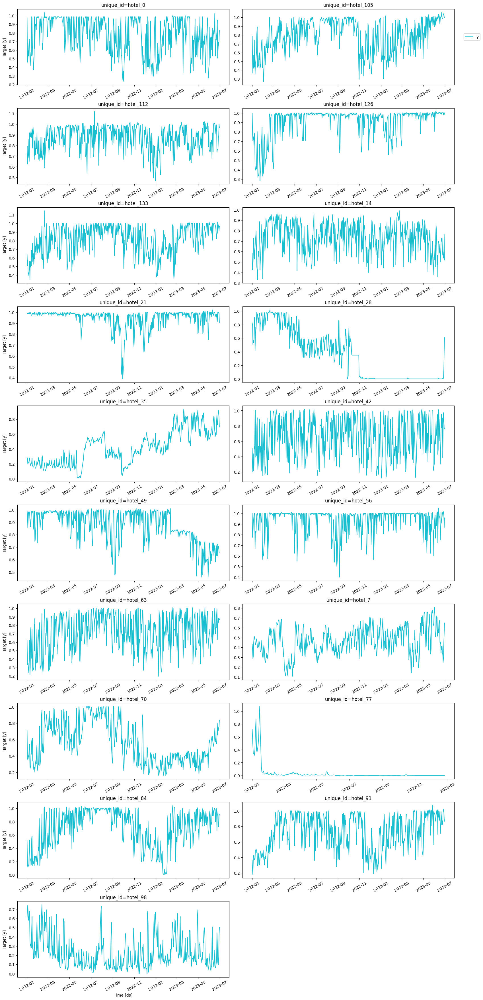

In [ ]:
plot_series(df= tidy_df, max_ids = 19)

#**StatsForecast Models:**
*Naive, Seasonal Naive, AutoETS, & AutoARIMA*

**Test and Training Set**

In [4]:
#cleaning the training data:
train = tidy_df.query('ds < "2023-06-01" ')
test = tidy_df.query('ds >= "2023-06-01" ')
train_clean = (
    train.copy()
    .assign(
        holiday_flag = lambda x: x.holiday_flag.astype('category'),
        target_day = lambda x: x.target_day.astype('category'),
        target_month = lambda x: x.target_month.astype('category'),
        location_type = lambda x: x.location_type.astype('category'),
        hotel_type = lambda x: x.hotel_type.astype('category')
    )
    .query('unique_id != "hotel_77"')
)


for i in range(1, 28):
    train_clean = train_clean.drop(f'otb_{i}', axis=1)

#train_clean.info()
train_clean.value_counts('unique_id').sort_values()

#cleaning the testing data:

test_clean = (
    test.copy()
    .assign(
        holiday_flag = lambda x: x.holiday_flag.astype('category'),
        target_day = lambda x: x.target_day.astype('category'),
        target_month = lambda x: x.target_month.astype('category'),
        location_type = lambda x: x.location_type.astype('category'),
        hotel_type = lambda x: x.hotel_type.astype('category')
    )
    .query('unique_id != "hotel_77"')
)


for i in range(1, 28):
    test_clean = test_clean.drop(f'otb_{i}', axis=1)

#train_clean.info()
test_clean.value_counts('unique_id').sort_values()


,count
unique_id,
hotel_0,30
hotel_105,30
hotel_112,30
hotel_126,30
hotel_133,30
hotel_14,30
hotel_21,30
hotel_28,30
hotel_35,30


**Cross-Validation**

In [ ]:
baseline_models = [
    Naive(),
    SeasonalNaive(season_length=7, alias = 'SeasonalNaive'),
    AutoETS(season_length=7, alias = 'AutoETS'),
    AutoARIMA(season_length=7, alias = 'AutoARIMA_NoPred')
]

sf_baseline = StatsForecast(
    models=baseline_models,
    freq='D',
    n_jobs=-1
)

cv_baseline = sf_baseline.cross_validation(
    h = 28,
    df = train_clean[['unique_id', 'ds', 'y']],
    n_windows=5,
    step_size=28
)

display(cv_baseline)

,unique_id,ds,cutoff,y,Naive,SeasonalNaive,AutoETS,AutoARIMA_NoPred
0,hotel_0,2023-01-12,2023-01-11,0.493827,0.45679,0.382716,0.496705,0.512659
1,hotel_0,2023-01-13,2023-01-11,0.790123,0.45679,0.679012,0.610945,0.624891
2,hotel_0,2023-01-14,2023-01-11,0.938272,0.45679,0.629630,0.641784,0.621807
3,hotel_0,2023-01-15,2023-01-11,0.604938,0.45679,0.358025,0.442096,0.400411
4,hotel_0,2023-01-16,2023-01-11,0.469136,0.45679,0.555556,0.449137,0.449506
...,...,...,...,...,...,...,...,...
2515,hotel_98,2023-05-27,2023-05-03,0.169355,0.16129,0.645161,0.375738,0.426264
2516,hotel_98,2023-05-28,2023-05-03,0.088710,0.16129,0.693548,0.187267,0.249053
2517,hotel_98,2023-05-29,2023-05-03,0.056452,0.16129,0.217742,0.166117,0.191798
2518,hotel_98,2023-05-30,2023-05-03,0.048387,0.16129,0.161290,0.168325,0.206000


**StatsForecast: Model Evaluation**

In [ ]:
import numpy as np


In [ ]:
eval_baseline = evaluate(
    df= cv_baseline,
    metrics= [rmse, mae],
    models = ['Naive', 'SeasonalNaive', 'AutoETS', 'AutoARIMA_NoPred'],
    agg_fn =None
)

sorted_output = (
    eval_baseline
    .groupby(["unique_id", "metric"])
    .mean(numeric_only=True)
    .reset_index()
)

baseline_eval_table = sorted_output.sort_values(["unique_id", "metric"])


display(baseline_eval_table)

/tmp/ipython-input-78223235.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["unique_id", "metric"])


,unique_id,metric,Naive,SeasonalNaive,AutoETS,AutoARIMA_NoPred
0,hotel_0,mae,0.230776,0.200088,0.217211,0.191407
1,hotel_0,rmse,0.277786,0.242425,0.253875,0.228731
2,hotel_105,mae,0.148338,0.122013,0.121080,0.123655
3,hotel_105,rmse,0.177526,0.152778,0.146151,0.148095
4,hotel_112,mae,0.117946,0.106696,0.097166,0.096974
5,hotel_112,rmse,0.139810,0.132366,0.111908,0.112608
6,hotel_126,mae,0.053984,0.079824,0.071478,0.063616
7,hotel_126,rmse,0.077814,0.101846,0.090675,0.076923
8,hotel_133,mae,0.128454,0.136651,0.125124,0.134735
9,hotel_133,rmse,0.156172,0.172360,0.148624,0.161426


*MAE*

In [ ]:
agg_eval = (
    eval_baseline
    .groupby(["unique_id", "metric"])
    .mean(numeric_only=True)
    .reset_index()
)

# sorting the table for readability
agg_eval = agg_eval.sort_values(["unique_id", "metric"]).reset_index(drop=True)


model_cols = [c for c in agg_eval.columns if c not in ["unique_id", "metric"]]

evaluation = (
    agg_eval
    .assign(best_model=lambda x: x[model_cols].idxmin(axis=1))
)

evaluation_mae = (
    evaluation
    .query("metric == 'mae'")
    .reset_index(drop=True)
)

display(evaluation_mae.value_counts("best_model"))



/tmp/ipython-input-3663922777.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["unique_id", "metric"])
/tmp/ipython-input-3663922777.py:16: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  .assign(best_model=lambda x: x[model_cols].idxmin(axis=1))


,count
best_model,
AutoARIMA_NoPred,7
AutoETS,5
Naive,4
SeasonalNaive,2


*RMSE*

In [ ]:
evaluation_rmse = (
    evaluation
    .query("metric == 'rmse'")
    .reset_index(drop=True)
)

evaluation_rmse.value_counts("best_model")

,count
best_model,
AutoARIMA_NoPred,8
AutoETS,5
Naive,3
SeasonalNaive,2


#**Plotting Forecasts vs. Actuals: StatsForecast**

Naive Model

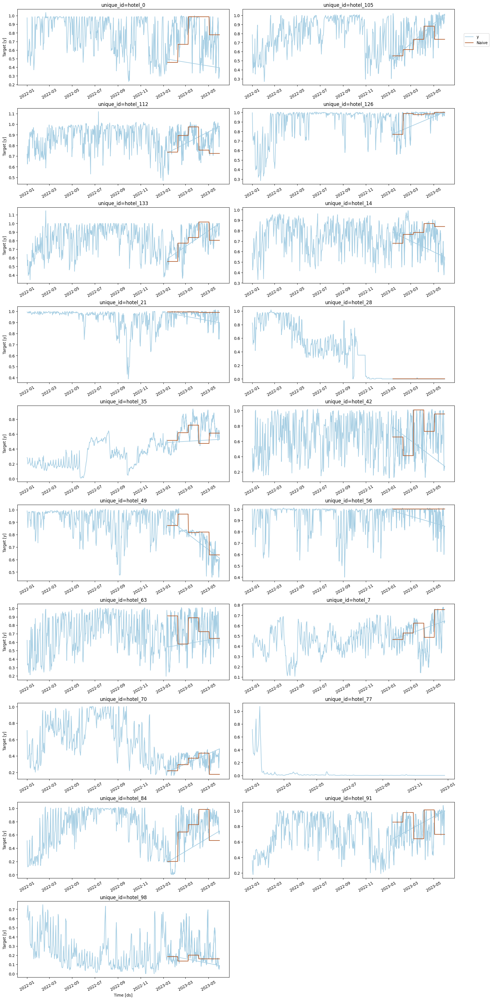

In [ ]:
display(plot_series(
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_baseline,
    max_ids= 19,
    models = ['Naive'],
    palette = 'Paired'
  )
)

Seasonal Naive

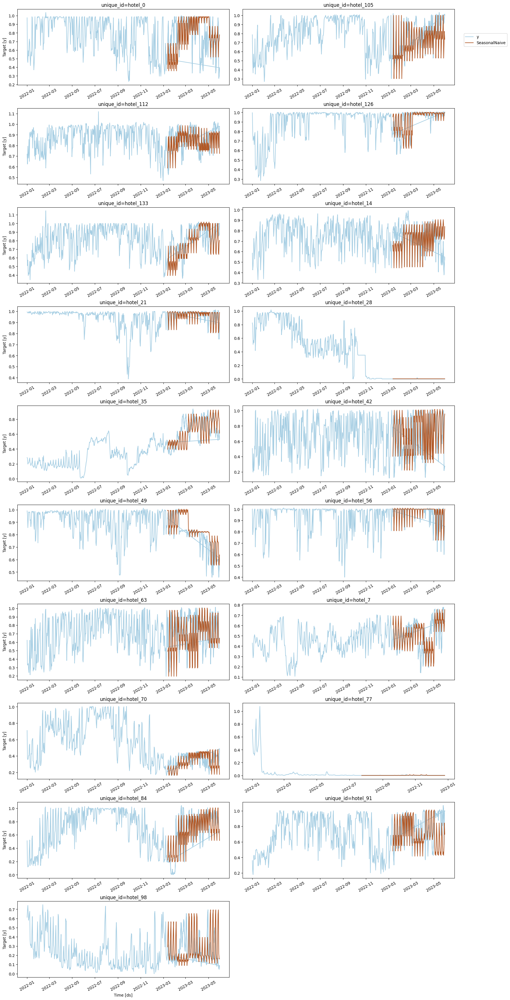

In [ ]:
display(plot_series(
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_baseline,
    max_ids= 19,
    models = ['SeasonalNaive'],
    palette = 'Paired'
  )
)

AutoETS

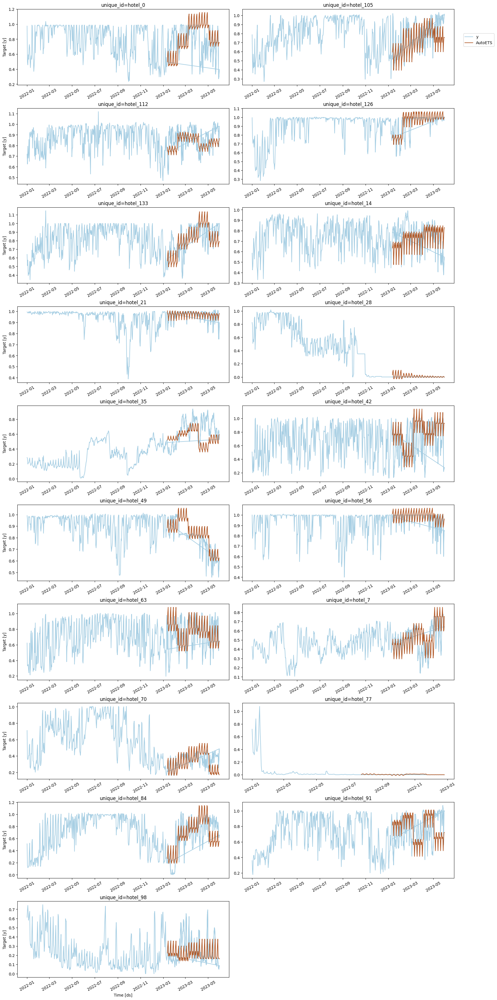

In [ ]:
display(plot_series(
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_baseline,
    max_ids= 19,
    models = ['AutoETS'],
    palette = 'Paired'
  )
)

AutoARIMA

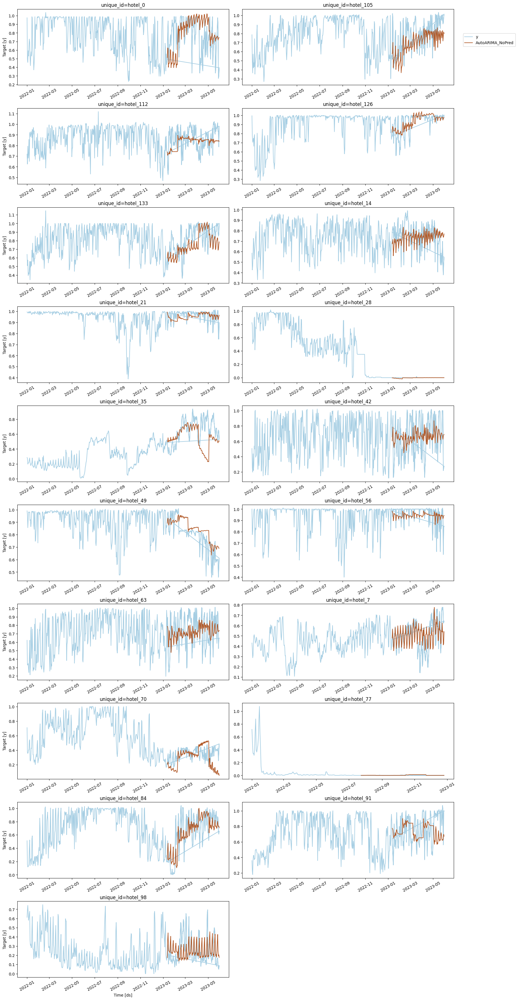

In [ ]:
display(plot_series(
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_baseline,
    max_ids= 19,
    models = ['AutoARIMA_NoPred'],
    palette = 'Paired'
  )
)

**Interpretation**

Above, I have run cross validation for all of the functions under the StatsForecast Module, including both Naive Models, AutoETS, and AutoARIMA. After evaluating each through the use of performance metrics (mae, mape, rmse), it is evident which models were more successful than the others. The AutoARIMA model performed the best across the board, having the most wins for both metrics. It was expected that the two auto functions would be more accurate, since their procedure is much more precise than the simplicity of the two Naive Models. I had originally used MAPE as one of my metrics, but remembered that it's not always smart to use in this situation. When dealing with numbers that are close to zero, MAPE can be unreliable due to the division of decimals making numbers larger than they should be.

#**ML Forecasts**

*LightGBM*

**Cross-Validation**

In [5]:
#data cleaning to help run the model smoother
tidy_df['unique_id'] = tidy_df['unique_id'].astype('category')

ml_models = {
    "lightgbm": LGBMRegressor()
  }
ml_forecast = MLForecast(
    models = ml_models,
    freq= 'D',
    lags= [1, 7, 14, 28],
    lag_transforms = {
        7: [RollingMean(window_size=7)],   # weekly average
        28: [RollingMean(window_size=14)], # 2-week rolling mean from 4 weeks ago
        }
    )
#run cross validation on the lightGBM model
cv_mlforecast = ml_forecast.cross_validation(
    df = train_clean[['unique_id', 'ds', 'y']],
    h = 28,
    n_windows = 5,
    step_size = 28,
    #static_features=['unique_id']
  )

display(cv_mlforecast)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 6030, number of used features: 6
[LightGBM] [Info] Start training from score 0.708325
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 6534, number of used features: 6
[LightGBM] [Info] Start training from score 0.700272
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 7038, number of used features: 6
[LightGBM] [Info] Start training 

,unique_id,ds,cutoff,y,lightgbm
0,hotel_0,2023-01-12,2023-01-11,0.493827,0.511859
1,hotel_0,2023-01-13,2023-01-11,0.790123,0.706928
2,hotel_0,2023-01-14,2023-01-11,0.938272,0.873912
3,hotel_0,2023-01-15,2023-01-11,0.604938,0.576473
4,hotel_0,2023-01-16,2023-01-11,0.469136,0.543397
...,...,...,...,...,...
2515,hotel_98,2023-05-27,2023-05-03,0.169355,0.334427
2516,hotel_98,2023-05-28,2023-05-03,0.088710,0.369728
2517,hotel_98,2023-05-29,2023-05-03,0.056452,0.367789
2518,hotel_98,2023-05-30,2023-05-03,0.048387,0.365085


**MLForecast: Model Evaluation**

In [6]:
#evaluate the lightGBM model compared to the true values
eval_mlforecast = evaluate(
    df=cv_mlforecast,
    metrics=[rmse, mae],
    models=['lightgbm'],
    id_col='unique_id',
    agg_fn=None
)

mlforecast_eval_table = (
    eval_mlforecast
    .groupby(["unique_id", "metric"])
    .mean(numeric_only=True)
    .reset_index()
    .sort_values(["unique_id", "metric"])
)

display(mlforecast_eval_table)

,unique_id,metric,lightgbm
0,hotel_0,mae,0.163557
1,hotel_0,rmse,0.209102
2,hotel_105,mae,0.126720
3,hotel_105,rmse,0.146469
4,hotel_112,mae,0.088607
5,hotel_112,rmse,0.107391
6,hotel_126,mae,0.084760
7,hotel_126,rmse,0.101115
8,hotel_133,mae,0.106537
9,hotel_133,rmse,0.130070


#**Plotting Forecasts vs. Actual: MLForecast**

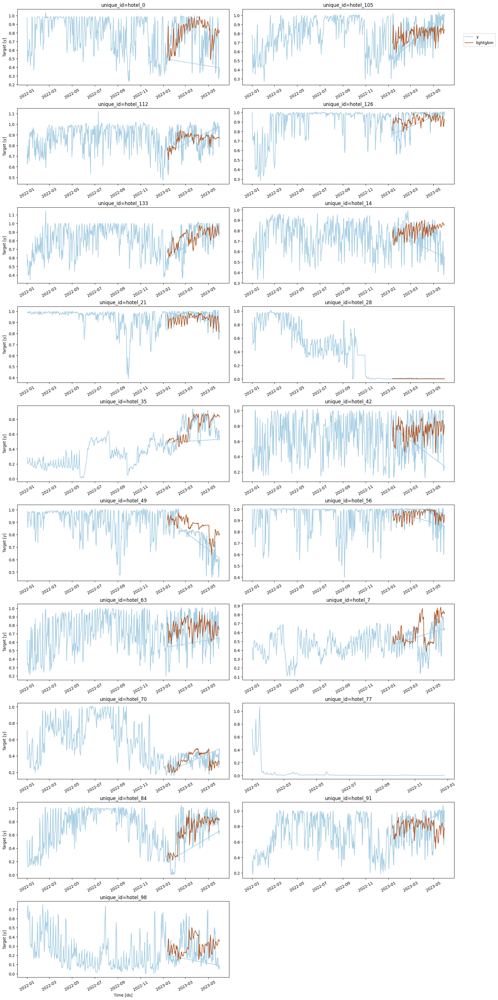

In [7]:
display(plot_series(  #Plotting the forecasted values vs the actual values
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_mlforecast,
    max_ids= 19,
    models = ['lightgbm'],
    palette = 'Paired'
  )
)

**Intepretation**

The MLForecast Model `LightGBM` was slightly more accurate, on average, in forecasting than the StatsForecast model. As you can see from the plots of actual vs. forecasted values (above), this model is pretty good at following a similar trend as the true data.

#**TimeGPT**

**Cross Validation**

In [8]:
%pip install nixtla
from nixtla import NixtlaClient

nixtla_client = NixtlaClient(
    api_key='nixak-eX92lSIatoWxvaVDNG4v7IFJQ5cva8FrMRaNuADzsiAlt007Tm8ejGc7VUU0MJEt2YZtsa2CmsfcbYPg'
)

nixtla_client.validate_api_key()  #validate the API key to make sure that it's working

cv_timegpt = nixtla_client.cross_validation(  #run cross validation on the timeGPT model
    df=train_clean,
    h=28,
    freq='D',
    n_windows = 5,
    step_size = 28,
)

cv_timegpt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.6/127.6 kB 3.8 MB/s eta 0:00:00


,unique_id,ds,cutoff,y,TimeGPT
0,hotel_0,2023-01-12,2023-01-11,0.493827,0.564389
1,hotel_0,2023-01-13,2023-01-11,0.790123,0.727987
2,hotel_0,2023-01-14,2023-01-11,0.938272,0.789590
3,hotel_0,2023-01-15,2023-01-11,0.604938,0.576806
4,hotel_0,2023-01-16,2023-01-11,0.469136,0.629866
...,...,...,...,...,...
2515,hotel_98,2023-05-27,2023-05-03,0.169355,0.300509
2516,hotel_98,2023-05-28,2023-05-03,0.088710,0.199598
2517,hotel_98,2023-05-29,2023-05-03,0.056452,0.171264
2518,hotel_98,2023-05-30,2023-05-03,0.048387,0.135154


**TimeGPT: Model Evaluation**

In [9]:
eval_timegpt = evaluate(
    df=cv_timegpt,
    metrics=[rmse, mae],
    models=['TimeGPT'],
    id_col='unique_id',
    agg_fn=None
)

timegpt_eval_table = (
    eval_timegpt
    .groupby(["unique_id", "metric"])
    .mean(numeric_only=True)
    .reset_index()
    .sort_values(["unique_id", "metric"])
)

display(timegpt_eval_table)

,unique_id,metric,TimeGPT
0,hotel_0,mae,0.119046
1,hotel_0,rmse,0.146939
2,hotel_105,mae,0.094942
3,hotel_105,rmse,0.114676
4,hotel_112,mae,0.086665
5,hotel_112,rmse,0.108312
6,hotel_126,mae,0.070247
7,hotel_126,rmse,0.092274
8,hotel_133,mae,0.095644
9,hotel_133,rmse,0.117609


#**Plotting Forecast vs. Actual: TimeGPT**

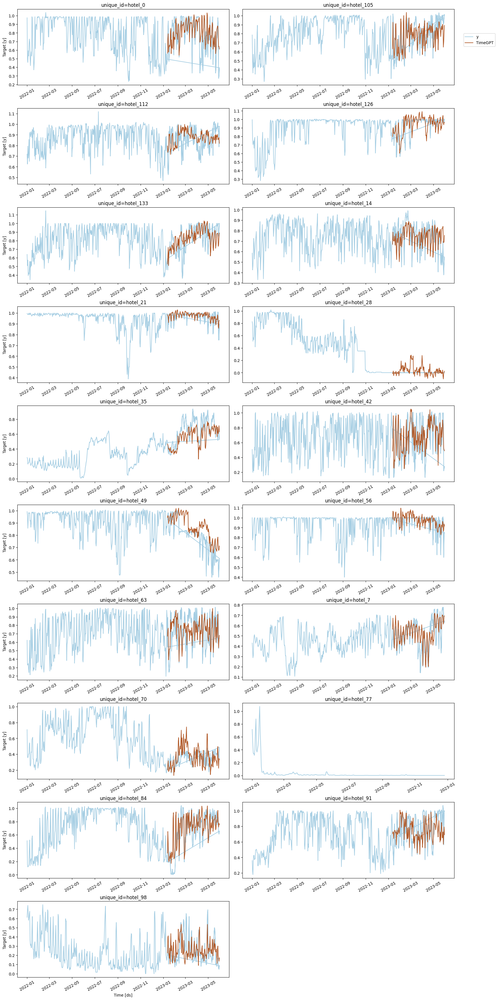

In [10]:
display(plot_series(    #Plotting the forecasted values vs the actual values
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_timegpt,
    max_ids= 19,
    models = ['TimeGPT'],
    palette = 'Paired'
  )
)

**Intepretation**

This has been by far our most accurate model yet. It has many more features and parameters that the previous models just cannot compete with. The forecasted values aren't that far off from the actual values, and the evaluation metrics back that up.

#**NeuralForecast**

*AutoNBEATS & AutoNHITS*

**Cross-Validation**

In [13]:
models = [
    AutoNBEATS(h=28, alias='AutoNBEATS', backend='optuna'),
    AutoNHITS(h=28, alias='AutoNHITS', backend='optuna')
]

nf = NeuralForecast(models=models, freq='D')

# Run cross-validation on the same train_clean subset you used for other CVs
cv_neural = nf.cross_validation(
    df = train_clean[['unique_id','ds','y']],
    h = 28,
    n_windows = 5,
    step_size = 28
)

[I 2025-12-04 23:42:16,971] A new study created in memory with name: no-name-d65e8bca-6a6a-4da7-ac30-ee343cce882c
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 16
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.7 M                                                                                            
Non-trainable params: 9.6 K                                                                                        
Total params: 2.7 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.


[I 2025-12-04 23:43:41,868] Trial 0 finished with value: 17.98418617248535 and parameters: {'learning_rate': 0.03500240476352529, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 256, 'random_seed': 16, 'input_size': 140, 'step_size': 1}. Best is trial 0 with value: 17.98418617248535.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 4
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.7 M                                                                                            
Non-trainable params: 9.6 K                                                                                        
Total params: 2.7 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


[I 2025-12-04 23:47:48,877] Trial 1 finished with value: 0.15274490416049957 and parameters: {'learning_rate': 0.005520052087436107, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 256, 'windows_batch_size': 512, 'random_seed': 4, 'input_size': 140, 'step_size': 1}. Best is trial 1 with value: 0.15274490416049957.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 9
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.5 M                                                                                            
Non-trainable params: 3.2 K                                                                                        
Total params: 2.5 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.


[I 2025-12-04 23:48:56,632] Trial 2 finished with value: 0.1504845917224884 and parameters: {'learning_rate': 0.0029234026122102255, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 256, 'windows_batch_size': 256, 'random_seed': 9, 'input_size': 28, 'step_size': 1}. Best is trial 2 with value: 0.1504845917224884.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 6
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.5 M                                                                                            
Non-trainable params: 3.2 K                                                                                        
Total params: 2.5 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


[I 2025-12-04 23:55:14,899] Trial 3 finished with value: 0.17199058830738068 and parameters: {'learning_rate': 0.0066704684588182106, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 64, 'windows_batch_size': 1024, 'random_seed': 6, 'input_size': 28, 'step_size': 28}. Best is trial 2 with value: 0.1504845917224884.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 4.8 K                                                                                        
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.


[I 2025-12-04 23:56:24,141] Trial 4 finished with value: 3.6249074935913086 and parameters: {'learning_rate': 0.04578257004260399, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 256, 'random_seed': 13, 'input_size': 56, 'step_size': 1}. Best is trial 2 with value: 0.1504845917224884.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 4
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.7 M                                                                                            
Non-trainable params: 9.6 K                                                                                        
Total params: 2.7 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


[I 2025-12-04 23:58:14,287] Trial 5 finished with value: 0.16357776522636414 and parameters: {'learning_rate': 0.00015104690720257473, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 128, 'random_seed': 4, 'input_size': 140, 'step_size': 1}. Best is trial 2 with value: 0.1504845917224884.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 3
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 4.8 K                                                                                        
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


[I 2025-12-05 00:04:39,521] Trial 6 finished with value: 0.16867132484912872 and parameters: {'learning_rate': 0.0025862986540285187, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 1024, 'random_seed': 3, 'input_size': 56, 'step_size': 28}. Best is trial 2 with value: 0.1504845917224884.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 15
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 6.4 K                                                                                        
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.


[I 2025-12-05 00:06:31,320] Trial 7 finished with value: 0.16174806654453278 and parameters: {'learning_rate': 0.00045387482162758254, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 512, 'random_seed': 15, 'input_size': 84, 'step_size': 1}. Best is trial 2 with value: 0.1504845917224884.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 14
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 4.8 K                                                                                        
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


[I 2025-12-05 00:10:21,342] Trial 8 finished with value: 8.744437217712402 and parameters: {'learning_rate': 0.03703302886070629, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 512, 'random_seed': 14, 'input_size': 56, 'step_size': 28}. Best is trial 2 with value: 0.1504845917224884.
/usr/local/lib/python3.12/dist-packages/neuralforecast/common/_base_auto.py:279: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 8
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 4.8 K                                                                                        
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


[I 2025-12-05 00:16:55,006] Trial 9 finished with value: 0.27807873487472534 and parameters: {'learning_rate': 0.015610445037844563, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 1024, 'random_seed': 8, 'input_size': 56, 'step_size': 28}. Best is trial 2 with value: 0.1504845917224884.
INFO:lightning_fabric.utilities.seed:Seed set to 9
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.5 M                                                                                            
Non-trainable params: 3.2 K                                                                                        
Total params: 2.5 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 31                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

[I 2025-12-05 00:18:06,165] A new study created in memory with name: no-name-5f46ec1f-b1c7-42eb-bb9b-f5bfea316bc6
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 2] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Cho

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.7 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.7 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=800.0` reached.


[I 2025-12-05 00:19:37,777] Trial 0 finished with value: 179.37339782714844 and parameters: {'n_pool_kernel_size': [8, 4, 1], 'n_freq_downsample': [180, 60, 1], 'learning_rate': 0.03697389713562433, 'scaler_type': None, 'max_steps': 800.0, 'batch_size': 128, 'windows_batch_size': 128, 'random_seed': 15, 'input_size': 140, 'step_size': 1}. Best is trial 0 with value: 179.37339782714844.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarn

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=900.0` reached.


[I 2025-12-05 00:21:09,111] Trial 1 finished with value: 0.14409203827381134 and parameters: {'n_pool_kernel_size': [1, 1, 1], 'n_freq_downsample': [24, 12, 1], 'learning_rate': 0.00018388299764036993, 'scaler_type': 'standard', 'max_steps': 900.0, 'batch_size': 256, 'windows_batch_size': 128, 'random_seed': 4, 'input_size': 84, 'step_size': 1}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: 

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=600.0` reached.


[I 2025-12-05 00:23:24,083] Trial 2 finished with value: 0.15239037573337555 and parameters: {'n_pool_kernel_size': [8, 4, 1], 'n_freq_downsample': [168, 24, 1], 'learning_rate': 0.0006395954678889936, 'scaler_type': None, 'max_steps': 600.0, 'batch_size': 256, 'windows_batch_size': 512, 'random_seed': 16, 'input_size': 84, 'step_size': 1}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserW

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.7 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.7 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1500.0` reached.


[I 2025-12-05 00:29:37,773] Trial 3 finished with value: 0.16848190128803253 and parameters: {'n_pool_kernel_size': [4, 4, 4], 'n_freq_downsample': [60, 8, 1], 'learning_rate': 0.009043749599366322, 'scaler_type': 'standard', 'max_steps': 1500.0, 'batch_size': 256, 'windows_batch_size': 512, 'random_seed': 15, 'input_size': 140, 'step_size': 1}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: 

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.4 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.4 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.4 M                                                                                                
Total estimated model params size (MB): 9                                                                          
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1300.0` reached.


[I 2025-12-05 00:37:58,669] Trial 4 finished with value: 0.15306688845157623 and parameters: {'n_pool_kernel_size': [8, 4, 1], 'n_freq_downsample': [180, 60, 1], 'learning_rate': 0.004018828837433267, 'scaler_type': None, 'max_steps': 1300.0, 'batch_size': 64, 'windows_batch_size': 1024, 'random_seed': 11, 'input_size': 28, 'step_size': 28}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: User

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=900.0` reached.


[I 2025-12-05 00:39:37,678] Trial 5 finished with value: 7.440181255340576 and parameters: {'n_pool_kernel_size': [8, 4, 1], 'n_freq_downsample': [1, 1, 1], 'learning_rate': 0.06506076322580866, 'scaler_type': 'standard', 'max_steps': 900.0, 'batch_size': 128, 'windows_batch_size': 128, 'random_seed': 5, 'input_size': 84, 'step_size': 28}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWa

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.5 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=700.0` reached.


[I 2025-12-05 00:41:16,375] Trial 6 finished with value: 0.2513512969017029 and parameters: {'n_pool_kernel_size': [8, 4, 1], 'n_freq_downsample': [60, 8, 1], 'learning_rate': 0.02747922431666115, 'scaler_type': 'standard', 'max_steps': 700.0, 'batch_size': 64, 'windows_batch_size': 256, 'random_seed': 4, 'input_size': 56, 'step_size': 28}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserW

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.5 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=900.0` reached.


[I 2025-12-05 00:43:05,907] Trial 7 finished with value: 0.1527470499277115 and parameters: {'n_pool_kernel_size': [16, 8, 1], 'n_freq_downsample': [40, 20, 1], 'learning_rate': 0.010844162161713612, 'scaler_type': None, 'max_steps': 900.0, 'batch_size': 128, 'windows_batch_size': 128, 'random_seed': 14, 'input_size': 56, 'step_size': 1}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWar

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=600.0` reached.


[I 2025-12-05 00:45:21,293] Trial 8 finished with value: 0.17101618647575378 and parameters: {'n_pool_kernel_size': [16, 8, 1], 'n_freq_downsample': [1, 1, 1], 'learning_rate': 0.001131288619280531, 'scaler_type': 'robust', 'max_steps': 600.0, 'batch_size': 256, 'windows_batch_size': 512, 'random_seed': 9, 'input_size': 84, 'step_size': 28}. Best is trial 1 with value: 0.14409203827381134.
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.
  warnings.warn(message)
/usr/local/lib/python3.12/dist-packages/optuna/distributions.py:502: User

┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=600.0` reached.


[I 2025-12-05 00:46:25,420] Trial 9 finished with value: 0.1539452224969864 and parameters: {'n_pool_kernel_size': [2, 2, 1], 'n_freq_downsample': [60, 8, 1], 'learning_rate': 0.010786130524208614, 'scaler_type': None, 'max_steps': 600.0, 'batch_size': 32, 'windows_batch_size': 128, 'random_seed': 15, 'input_size': 84, 'step_size': 1}. Best is trial 1 with value: 0.14409203827381134.
INFO:lightning_fabric.utilities.seed:Seed set to 4
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ train │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 34                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=900.0` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

In [15]:
display(cv_neural.head())

,unique_id,ds,cutoff,AutoNBEATS,AutoNHITS,y
0,hotel_0,2023-01-12,2023-01-11,0.505530,0.432608,0.493827
1,hotel_0,2023-01-13,2023-01-11,0.580995,0.582119,0.790123
2,hotel_0,2023-01-14,2023-01-11,0.732542,0.595908,0.938272
3,hotel_0,2023-01-15,2023-01-11,0.553199,0.367253,0.604938
4,hotel_0,2023-01-16,2023-01-11,0.448495,0.391184,0.469136


**NeuralForecast: Model Evaluation**

In [16]:
eval_neuralforecast = evaluate( #evaluate the model based on rmse and mae
    df=cv_neural,
    metrics=[rmse, mae],  #don't use mape because the demand values are close to zero
    models=['AutoNBEATS', 'AutoNHITS'],
    id_col='unique_id',
    agg_fn=None
)

neuralforecast_eval_table = (
    eval_neuralforecast
    .groupby(["unique_id", "metric"])
    .mean(numeric_only=True)
    .reset_index()
    .sort_values(["unique_id", "metric"])
)

display(neuralforecast_eval_table)

,unique_id,metric,AutoNBEATS,AutoNHITS
0,hotel_0,mae,0.170634,0.184994
1,hotel_0,rmse,0.212717,0.217913
2,hotel_105,mae,0.141863,0.163338
3,hotel_105,rmse,0.163543,0.189160
4,hotel_112,mae,0.114702,0.102629
5,hotel_112,rmse,0.132948,0.123875
6,hotel_126,mae,0.063327,0.091612
7,hotel_126,rmse,0.080247,0.110033
8,hotel_133,mae,0.126606,0.168012
9,hotel_133,rmse,0.153805,0.193677


#**Plotting Forecasts vs. Actual: NeuralForecast**

AutoNBEATS

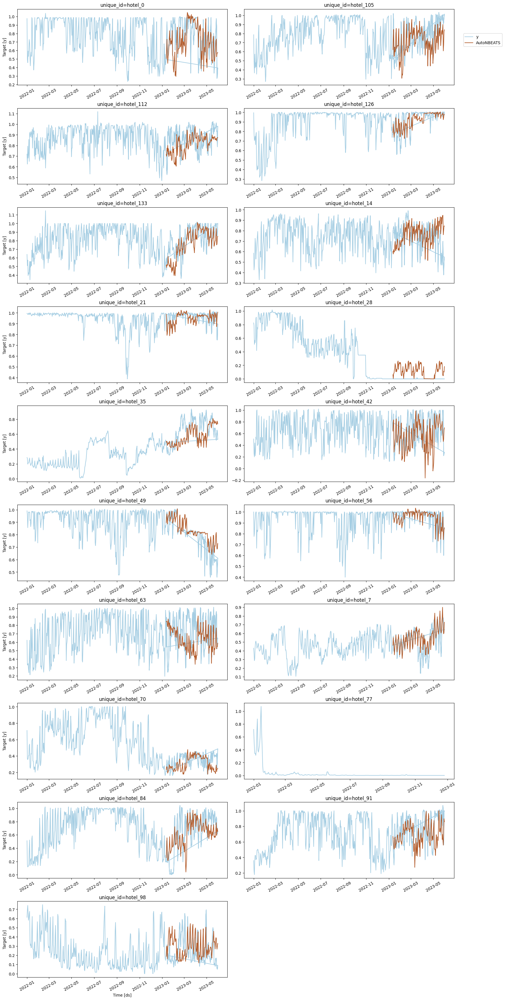

In [19]:
display(plot_series(
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_neural,
    max_ids= 19,
    models = ['AutoNBEATS'],
    palette = 'Paired'
  )
)

AutoNHITS

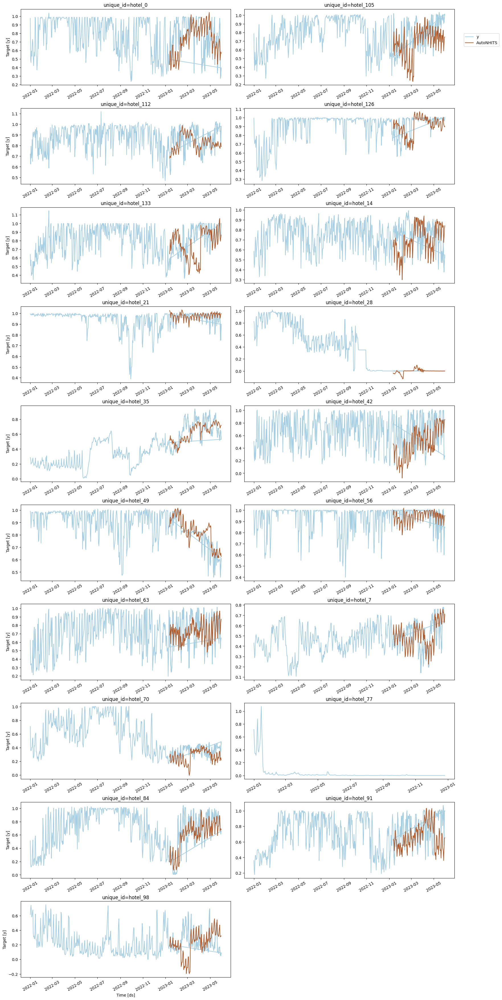

In [20]:
display(plot_series(
    df = tidy_df.query('ds < "2023-06-01" '),
    forecasts_df=cv_neural,
    max_ids= 19,
    models = ['AutoNHITS'],
    palette = 'Paired'
  )
)

#**Final Evaluation: Choosing the Best Model**
*Picking the Best Model & Forecasting the Next 4 Weeks*

In [18]:
#Reads in the count of each models wins (i.e. lowest specific metric per series)
model_wins = "/content/drive/MyDrive/ISA401/model_wins - Sheet1.csv"

model_wins = pd.read_csv(model_wins)

model_wins

,Model Name,Wins
0,Naive,3
1,SeasonalNaive,1
2,AutoETS,0
3,AutoARIMA,1
4,LightGBM,3
5,TimeGPT,25
6,AutoNBEATS,3
7,AutoNHITS,0


**Takeaway**

After training each model on the training set, it is very evident that the TimeGPT was the most accurate model in predicting the actual values based off its MAE and RMSE scores. No other model had the best performance on more than three instances, with TimeGPT having twenty-five wins between the two metrics.

#**Final Forecast: Forecasting the Next 28 Days**
*Using TimeGPT Model*

/usr/local/lib/python3.12/dist-packages/nixtla/nixtla_client.py:407: UserWarning: `df` contains the following exogenous features: ['holiday_flag', 'target_day', 'target_month', 'target_year', 'location_type', 'hotel_type', 'otb_28', 'otb_29', 'otb_30', 'otb_31', 'otb_32', 'otb_33', 'otb_34', 'otb_35', 'otb_36', 'otb_37', 'otb_38', 'otb_39', 'otb_40', 'otb_41', 'otb_42', 'otb_43', 'otb_44', 'otb_45', 'otb_46', 'otb_47', 'otb_48', 'otb_49', 'otb_50', 'otb_51', 'otb_52', 'otb_53', 'otb_54', 'otb_55', 'otb_56', 'otb_57', 'otb_58', 'otb_59', 'otb_60'], but `X_df` was not provided and they were not declared in `hist_exog_list`. They will be ignored.
  warnings.warn(


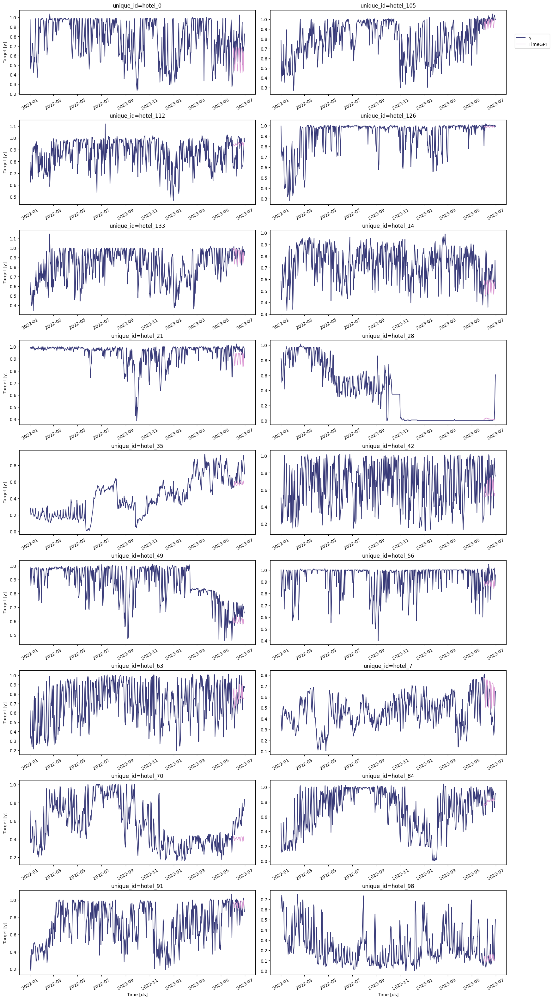

In [20]:
timegpt_forecast = nixtla_client.forecast(  #Forecasting and Plotting forecasted vs. actual on the whole data set, 'tidy_df'
    df=train_clean,
    h=28,
    freq='D',
    time_col='ds',
    target_col='y',
)

final_forecast = nixtla_client.plot(tidy_df, timegpt_forecast, time_col='ds', target_col='y', max_ids=18)
final_forecast

In [29]:
display(timegpt_forecast) #display the values forecasted by the model
timegpt_forecast.to_csv("final_testing_output.csv", index=False)  #saves forecasted values to .csv file


,unique_id,ds,TimeGPT
0,hotel_0,2023-06-01,0.580719
1,hotel_0,2023-06-02,0.666482
2,hotel_0,2023-06-03,0.683445
3,hotel_0,2023-06-04,0.512951
4,hotel_0,2023-06-05,0.443941
...,...,...,...
499,hotel_98,2023-06-24,0.160600
500,hotel_98,2023-06-25,0.116640
501,hotel_98,2023-06-26,0.104464
502,hotel_98,2023-06-27,0.101843


**Final Evaluation of TimeGPT Model on Test Set**

In [24]:
timegpt_results = (     #merging the forecast table and test set table for evaluation
    timegpt_forecast
    .merge(
        test_clean[['unique_id', 'ds', 'y']],
        on=['unique_id', 'ds'],
        how='left'
    )
)

In [27]:
#The final evaluation of the TimeGPT Model vs. the Test Set
eval_timegpt_final = evaluate(
    df=timegpt_results,
    metrics=[rmse, mae],
    models=['TimeGPT'],
    id_col='unique_id',
    agg_fn=None
)

final_eval_table = (
    eval_timegpt_final
    .groupby(["unique_id", "metric"])
    .mean(numeric_only=True)
    .reset_index()
    .sort_values(["unique_id", "metric"])
)

display(final_eval_table)
final_eval_table.to_csv("final_eval_table.csv", index=False)


,unique_id,metric,TimeGPT
0,hotel_0,mae,0.156620
1,hotel_0,rmse,0.184975
2,hotel_105,mae,0.040478
3,hotel_105,rmse,0.048499
4,hotel_112,mae,0.112343
5,hotel_112,rmse,0.135294
6,hotel_126,mae,0.019717
7,hotel_126,rmse,0.037496
8,hotel_133,mae,0.062408
9,hotel_133,rmse,0.077167


/usr/local/lib/python3.12/dist-packages/nixtla/nixtla_client.py:407: UserWarning: `df` contains the following exogenous features: ['holiday_flag', 'target_day', 'target_month', 'target_year', 'location_type', 'hotel_type', 'otb_1', 'otb_2', 'otb_3', 'otb_4', 'otb_5', 'otb_6', 'otb_7', 'otb_8', 'otb_9', 'otb_10', 'otb_11', 'otb_12', 'otb_13', 'otb_14', 'otb_15', 'otb_16', 'otb_17', 'otb_18', 'otb_19', 'otb_20', 'otb_21', 'otb_22', 'otb_23', 'otb_24', 'otb_25', 'otb_26', 'otb_27', 'otb_28', 'otb_29', 'otb_30', 'otb_31', 'otb_32', 'otb_33', 'otb_34', 'otb_35', 'otb_36', 'otb_37', 'otb_38', 'otb_39', 'otb_40', 'otb_41', 'otb_42', 'otb_43', 'otb_44', 'otb_45', 'otb_46', 'otb_47', 'otb_48', 'otb_49', 'otb_50', 'otb_51', 'otb_52', 'otb_53', 'otb_54', 'otb_55', 'otb_56', 'otb_57', 'otb_58', 'otb_59', 'otb_60'], but `X_df` was not provided and they were not declared in `hist_exog_list`. They will be ignored.
  warnings.warn(


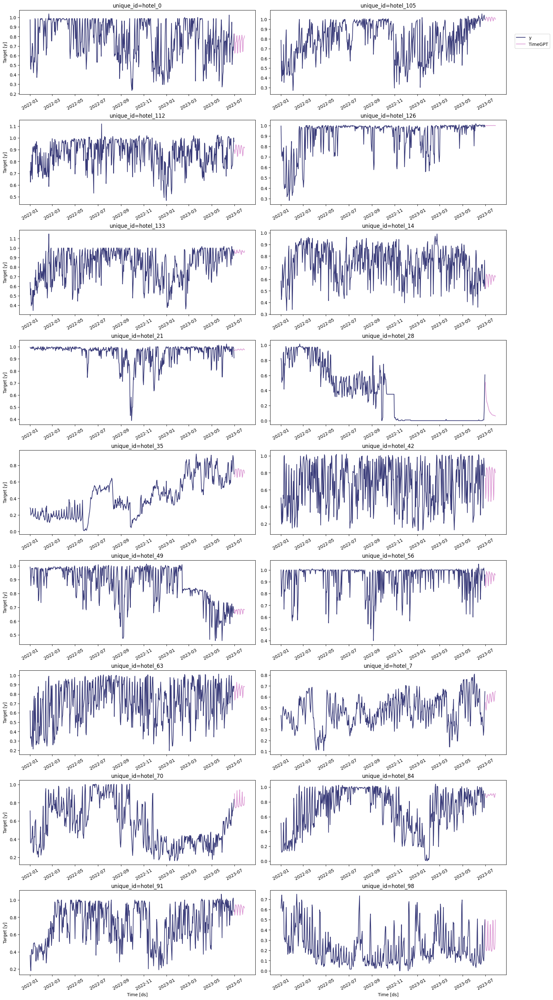

In [30]:
#creating a table of forecasted values from the TimeGPT model
timegpt_28day_forecast = nixtla_client.forecast(
    df=tidy_df,
    h=28,
    freq='D',
    time_col='ds',
    target_col='y',
)

#Plotting the forecasted values
next_28_forecast = nixtla_client.plot(tidy_df, timegpt_28day_forecast, time_col='ds', target_col='y', max_ids=18)
next_28_forecast

**Final Forecasted Values for Next 28 Days**

In [32]:
timegpt_28day_forecast.to_csv("final_forecast_table.csv", index=False)
display(timegpt_28day_forecast)


,unique_id,ds,TimeGPT
0,hotel_0,2023-07-01,0.827469
1,hotel_0,2023-07-02,0.624416
2,hotel_0,2023-07-03,0.635174
3,hotel_0,2023-07-04,0.732752
4,hotel_0,2023-07-05,0.741335
...,...,...,...
499,hotel_98,2023-07-24,0.215458
500,hotel_98,2023-07-25,0.207402
501,hotel_98,2023-07-26,0.218037
502,hotel_98,2023-07-27,0.280791
